# **Predicción del Movimiento de Nubes para la Optimización de Plantas Fotovoltaicas en Colombia**

## 1) Descarga de imágenes

A continuación se muestra el código empleado para la descarga de imágenes correspondientes a la banda 13 para el periodo de tiempo comprendido entre el 01/01/2024 y el 31/12/2024. Ingresar al siguiente repositorio de github: https://github.com/alwos19/monografia_esp_cd

## 2) Obtención del dataset

A partir de las imágenes obtenidas, se construyó un conjunto de datos (dataset) con las siguientes columnas: fecha, mes, hora, nombre del archivo, media, varianza, desviación estándar, mínimo, máximo y mediana. Las variables estadísticas fueron calculadas a partir de los valores de radiancia presentes en cada imagen, con el propósito de realizar un análisis exploratorio de los datos.

Asimismo, se incorporó una columna denominada archivo, que almacena los nombres de los archivos correspondientes a las imágenes descargadas. Esta decisión se tomó para evitar la generación de una matriz individual por cada imagen, ya que el tamaño de cada una (920x920 píxeles) representa una carga considerable en términos de recursos computacionales, lo cual podría comprometer el rendimiento del sistema o incluso provocar su bloqueo.

| Fecha               | Mes | Hora  | Hora Num | Archivo                          | Media     | Varianza   | Desviación Estándar | Mínimo   | Máximo    | Mediana   |
|---------------------|-----|-------|----------|----------------------------------|-----------|------------|----------------------|----------|-----------|-----------|
| 2024-01-01 00:00:00 | 1   | 00:00 | 0        | RadFC_20240101000020_Rad13.npy  | 75.832336 | 614.352234 | 24.786129            | 7.227110 | 104.218140| 86.155220 |
| 2024-01-01 01:00:00 | 1   | 01:00 | 1        | RadFC_20240101010020_Rad13.npy  | 75.948067 | 559.567871 | 23.655188            | 8.690435 | 103.303566| 85.149185 |
| 2024-01-01 02:00:00 | 1   | 02:00 | 2        | RadFC_20240101020020_Rad13.npy  | 75.844902 | 507.472351 | 22.527147            | 8.324604 | 102.754814| 83.731590 |
| 2024-01-01 03:00:00 | 1   | 03:00 | 3        | RadFC_20240101030020_Rad13.npy  | 75.947083 | 460.890533 | 21.468361            | 7.318568 | 103.852310| 82.954193 |
| 2024-01-01 04:00:00 | 1   | 04:00 | 4        | RadFC_20240101040020_Rad13.npy  | 76.251312 | 412.671051 | 20.314306            | 9.284912 | 102.663361| 82.451180 |


### Imágenes Validas

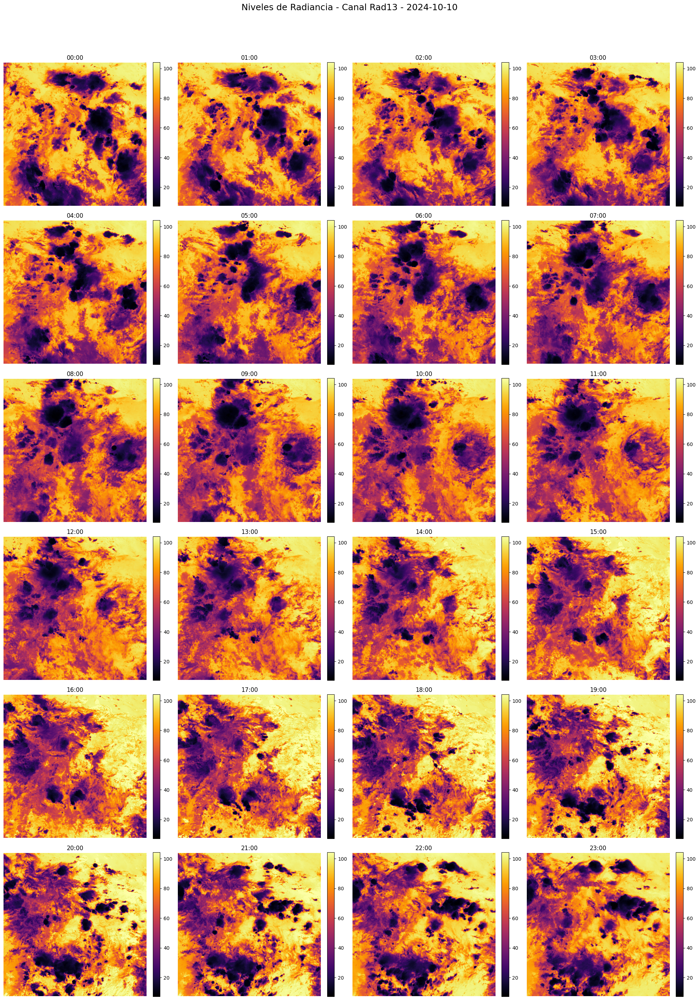

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
from datetime import datetime

# Configura tu directorio de imágenes
directorio = Path("/home/fisica/bandas/banda13/imagenes_validas")  # ← CAMBIA ESTA RUTA
canal = "Rad13"
fecha_deseada = "2024-10-10"

# Regex para extraer fecha y hora del nombre del archivo
pat = re.compile(r"RadFC_(\d{8})(\d{6})_Rad13\.npy")

# Filtrar archivos del canal y día deseado
archivos = sorted([
    f for f in directorio.glob(f"*{canal}.npy")
    if pat.match(f.name) and pat.match(f.name).group(1) == fecha_deseada.replace("-", "")
])

# Parámetros de visualización
vmin, vmax = 7.22, 104.22
n = len(archivos)
cols = 4
rows = (n + cols - 1) // cols  # redondear hacia arriba

fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 5 * rows))
axs = axs.flatten()

for i, (f, ax) in enumerate(zip(archivos, axs)):
    datos = np.load(f)
    fecha_str = pat.match(f.name).group(1) + pat.match(f.name).group(2)
    timestamp = datetime.strptime(fecha_str, "%Y%m%d%H%M%S")

    im = ax.imshow(datos, cmap='inferno', vmin=vmin, vmax=vmax)
    ax.set_title(timestamp.strftime("%H:%M"))
    ax.axis("off")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# Eliminar subplots no usados
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.suptitle(f"Niveles de Radiancia - Canal {canal} - {fecha_deseada}", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## 3) Análisis Exploratorio
En esta sección se realiza la visualización de algunas de las imágenes, así como el análisis gráfico de la radiancia mínima, máxima y promedio a lo largo de los meses del año como en las diferentes horas del día.
Además, se generó un mapa de calor del promedio de radiancia por hora y por mes, con el objetivo de identificar posibles valores atípicos.
Finalmente, se analizó la distribución temporal de la radiancia en términos de sus valores promedio, máximos y mínimos.

In [41]:
import os
import numpy as np
import pandas as pd
from datetime import datetime
from concurrent.futures import ProcessPoolExecutor

# Ruta donde están almacenados los archivos .npy
ruta_archivos = "/home/fisica/bandas/banda13/imagenes_validas"
# Listar todos los archivos en la ruta
archivos = os.listdir(ruta_archivos)

# Función para procesar un archivo individual (sin guardar la matriz radiancia)
def procesar_archivo(archivo):
    if archivo.endswith(".npy") and archivo.startswith("RadFC_"):
        try:
            nombre = archivo.replace("RadFC_", "").replace("_Rad13.npy", "")
            fecha_str = nombre[:12]  # 'YYYYMMDDHHMM'
            fecha_datetime = datetime.strptime(fecha_str, "%Y%m%d%H%M")
            fecha = fecha_datetime
            mes = fecha_datetime.month
            hora = fecha_datetime.strftime("%H:%M")
            hora_num = fecha_datetime.hour
            ruta_completa = os.path.join(ruta_archivos, archivo)
            radiancia = np.load(ruta_completa).astype(np.float32)
            if radiancia.shape == (920, 920):
                return {
                    "fecha": fecha,
                    "mes": mes,
                    "hora": hora,
                    "hora_num": hora_num,
                    "archivo": archivo,
                    "media": np.mean(radiancia),
                    "varianza": np.var(radiancia),
                    "desviacion_estandar": np.std(radiancia),
                    "minimo": np.min(radiancia),
                    "maximo": np.max(radiancia),
                    "mediana": np.median(radiancia),
                }
            else:
                print(f"Dimensiones incorrectas en: {archivo}")
        except Exception as e:
            print(f"Error procesando {archivo}: {e}")
    return None

# Procesar archivos en paralelo
def procesar_archivos_en_paralelo(archivos, num_workers=os.cpu_count()):
    datos = []
    with ProcessPoolExecutor(max_workers=num_workers) as executor:
        resultados = executor.map(procesar_archivo, archivos)
        for resultado in resultados:
            if resultado is not None:
                datos.append(resultado)
    return datos

# Ejecutar el procesamiento en paralelo
datos = procesar_archivos_en_paralelo(archivos)

# Crear el DataFrame y establecer 'fecha' como índice
df_imagenes = pd.DataFrame(datos)

# Convertir la columna 'fecha' a tipo datetime y establecerla como índice
df_imagenes["fecha"] = pd.to_datetime(df_imagenes["fecha"])
df_imagenes = df_imagenes.set_index("fecha")

# Ordenar el DataFrame por índice (fecha)
df_imagenes.sort_index(inplace=True)

# Imprimir las primeras filas
print(df_imagenes.head())

                     mes   hora  hora_num                         archivo  \
fecha                                                                       
2024-01-01 00:00:00    1  00:00         0  RadFC_20240101000020_Rad13.npy   
2024-01-01 01:00:00    1  01:00         1  RadFC_20240101010020_Rad13.npy   
2024-01-01 02:00:00    1  02:00         2  RadFC_20240101020020_Rad13.npy   
2024-01-01 03:00:00    1  03:00         3  RadFC_20240101030020_Rad13.npy   
2024-01-01 04:00:00    1  04:00         4  RadFC_20240101040020_Rad13.npy   

                         media    varianza  desviacion_estandar    minimo  \
fecha                                                                       
2024-01-01 00:00:00  75.832336  614.352234            24.786129  7.227110   
2024-01-01 01:00:00  75.948067  559.567871            23.655188  8.690435   
2024-01-01 02:00:00  75.844902  507.472351            22.527147  8.324604   
2024-01-01 03:00:00  75.947083  460.890533            21.468361  7.318568  

In [42]:
df_imagenes.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8713 entries, 2024-01-01 00:00:00 to 2024-12-31 23:00:00
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mes                  8713 non-null   int64  
 1   hora                 8713 non-null   object 
 2   hora_num             8713 non-null   int64  
 3   archivo              8713 non-null   object 
 4   media                8713 non-null   float32
 5   varianza             8713 non-null   float32
 6   desviacion_estandar  8713 non-null   float32
 7   minimo               8713 non-null   float32
 8   maximo               8713 non-null   float32
 9   mediana              8713 non-null   float32
dtypes: float32(6), int64(2), object(2)
memory usage: 544.6+ KB


* Mínimo de radiancia

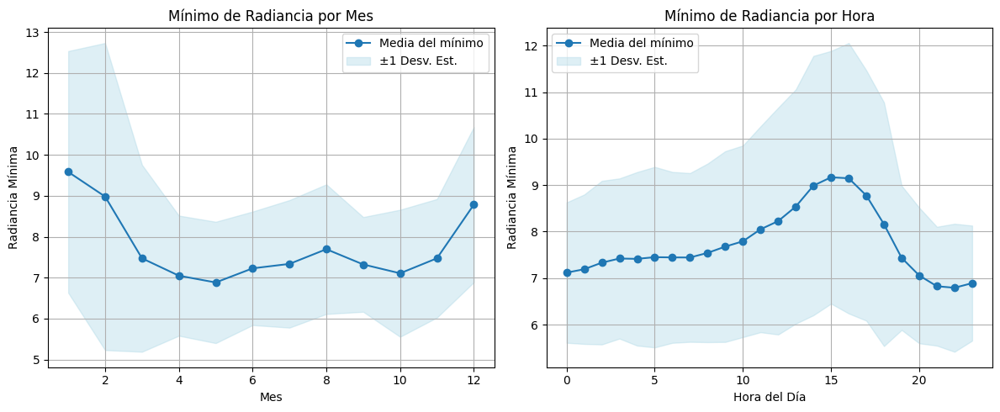

In [4]:
# ----- RESUMEN POR MES -----
resumen_min_mes = df_imagenes.groupby('mes')['minimo'].agg(['mean', 'std']).reset_index()
resumen_min_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_min_hora = df_imagenes.groupby('hora_num')['minimo'].agg(['mean', 'std']).reset_index()
resumen_min_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_min_mes['mes'], resumen_min_mes['media'], marker='o', label='Media del mínimo')
plt.fill_between(resumen_min_mes['mes'],
                 resumen_min_mes['media'] - resumen_min_mes['desviacion_estandar'],
                 resumen_min_mes['media'] + resumen_min_mes['desviacion_estandar'],
                 color='lightblue', alpha=0.4, label='±1 Desv. Est.')
plt.title('Mínimo de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Mínima')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_min_hora['hora_num'], resumen_min_hora['media'], marker='o', label='Media del mínimo')
plt.fill_between(resumen_min_hora['hora_num'],
                 resumen_min_hora['media'] - resumen_min_hora['desviacion_estandar'],
                 resumen_min_hora['media'] + resumen_min_hora['desviacion_estandar'],
                 color='lightblue', alpha=0.4, label='±1 Desv. Est.')
plt.title('Mínimo de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Mínima')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Máximo de radiancia

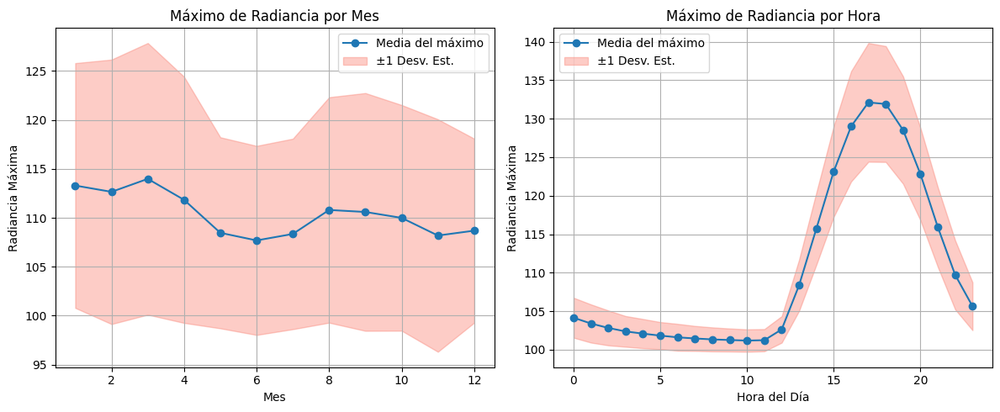

In [5]:
# ----- RESUMEN POR MES -----
resumen_max_mes = df_imagenes.groupby('mes')['maximo'].agg(['mean', 'std']).reset_index()
resumen_max_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_max_hora = df_imagenes.groupby('hora_num')['maximo'].agg(['mean', 'std']).reset_index()
resumen_max_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_max_mes['mes'], resumen_max_mes['media'], marker='o', label='Media del máximo')
plt.fill_between(resumen_max_mes['mes'],
                 resumen_max_mes['media'] - resumen_max_mes['desviacion_estandar'],
                 resumen_max_mes['media'] + resumen_max_mes['desviacion_estandar'],
                 color='salmon', alpha=0.4, label='±1 Desv. Est.')
plt.title('Máximo de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Máxima')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_max_hora['hora_num'], resumen_max_hora['media'], marker='o', label='Media del máximo')
plt.fill_between(resumen_max_hora['hora_num'],
                 resumen_max_hora['media'] - resumen_max_hora['desviacion_estandar'],
                 resumen_max_hora['media'] + resumen_max_hora['desviacion_estandar'],
                 color='salmon', alpha=0.4, label='±1 Desv. Est.')
plt.title('Máximo de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Máxima')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Promedio de radiancia

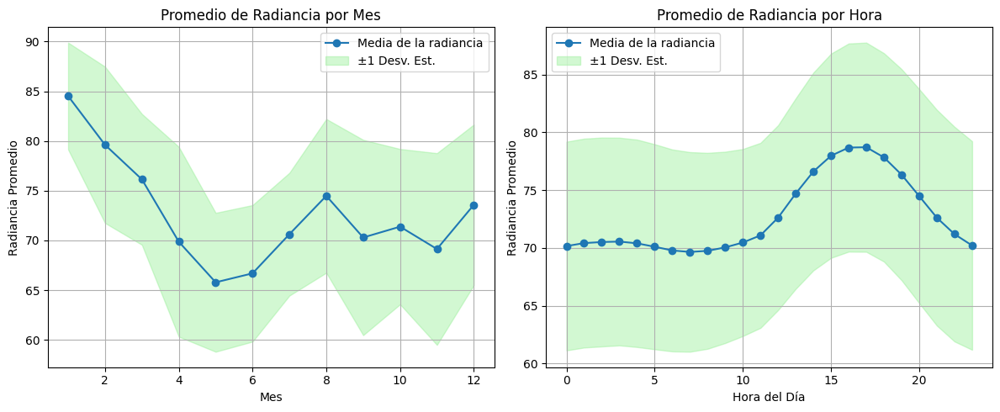

In [6]:
# ----- RESUMEN POR MES -----
resumen_media_mes = df_imagenes.groupby('mes')['media'].agg(['mean', 'std']).reset_index()
resumen_media_mes.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- RESUMEN POR HORA -----
resumen_media_hora = df_imagenes.groupby('hora_num')['media'].agg(['mean', 'std']).reset_index()
resumen_media_hora.rename(columns={'mean': 'media', 'std': 'desviacion_estandar'}, inplace=True)

# ----- GRAFICAR -----
plt.figure(figsize=(12, 5))

# Por mes
plt.subplot(1, 2, 1)
plt.plot(resumen_media_mes['mes'], resumen_media_mes['media'], marker='o', label='Media de la radiancia')
plt.fill_between(resumen_media_mes['mes'],
                 resumen_media_mes['media'] - resumen_media_mes['desviacion_estandar'],
                 resumen_media_mes['media'] + resumen_media_mes['desviacion_estandar'],
                 color='lightgreen', alpha=0.4, label='±1 Desv. Est.')
plt.title('Promedio de Radiancia por Mes')
plt.xlabel('Mes')
plt.ylabel('Radiancia Promedio')
plt.legend()
plt.grid(True)

# Por hora
plt.subplot(1, 2, 2)
plt.plot(resumen_media_hora['hora_num'], resumen_media_hora['media'], marker='o', label='Media de la radiancia')
plt.fill_between(resumen_media_hora['hora_num'],
                 resumen_media_hora['media'] - resumen_media_hora['desviacion_estandar'],
                 resumen_media_hora['media'] + resumen_media_hora['desviacion_estandar'],
                 color='lightgreen', alpha=0.4, label='±1 Desv. Est.')
plt.title('Promedio de Radiancia por Hora')
plt.xlabel('Hora del Día')
plt.ylabel('Radiancia Promedio')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

* Mapa de calor

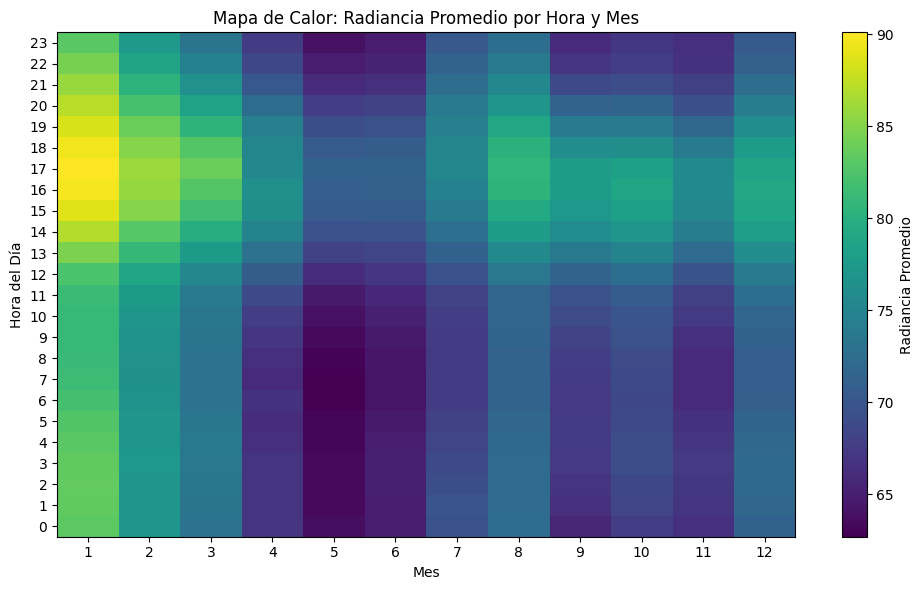

In [7]:
# Crear tabla pivote (hora vs mes)
pivot_heatmap = df_imagenes.pivot_table(
    values='media',
    index='hora_num',
    columns='mes',
    aggfunc='mean'
)

# Heatmap
plt.figure(figsize=(10, 6))
plt.imshow(pivot_heatmap, aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Radiancia Promedio')
plt.title('Mapa de Calor: Radiancia Promedio por Hora y Mes')
plt.xlabel('Mes')
plt.ylabel('Hora del Día')
plt.xticks(ticks=np.arange(0, 12), labels=[str(m) for m in range(1, 13)])
plt.yticks(ticks=np.arange(0, 24), labels=[str(h) for h in range(0, 24)])
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia promedio

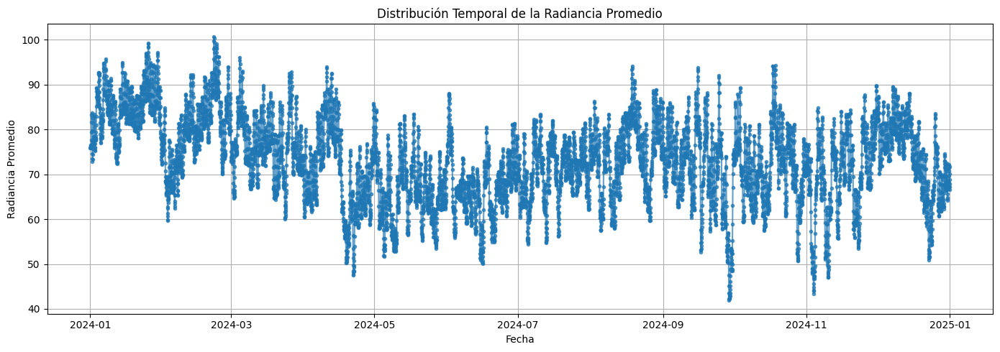

In [8]:
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['media'], marker='.', linestyle='-', alpha=0.7)
plt.title('Distribución Temporal de la Radiancia Promedio')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Promedio')
plt.grid(True)
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia mínima

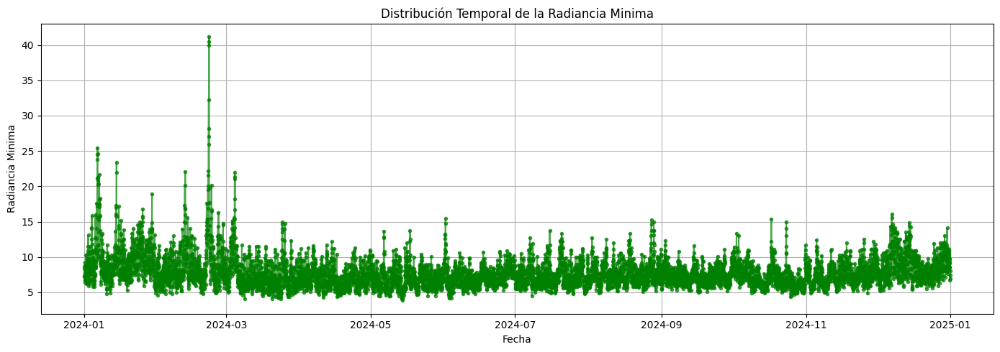

In [9]:
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['minimo'], marker='.', linestyle='-', alpha=0.7, color='green')
plt.title('Distribución Temporal de la Radiancia Minima')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Minima')
plt.grid(True)
plt.tight_layout()
plt.show()

* Línea temporal de la radiancia máxima

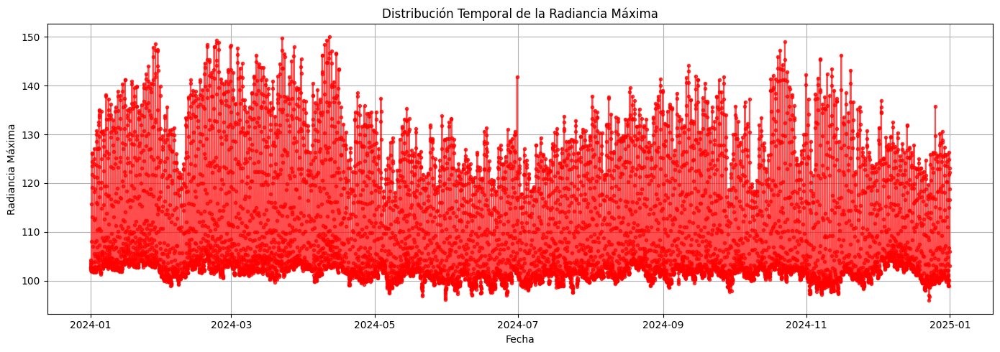

In [15]:
# Línea temporal de radiancia Máxima
plt.figure(figsize=(14, 5))
plt.plot(df_imagenes.index, df_imagenes['maximo'], marker='.', linestyle='-', alpha=0.7, color='red')
plt.title('Distribución Temporal de la Radiancia Máxima')
plt.xlabel('Fecha')
plt.ylabel('Radiancia Máxima')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4) Análisis de series de tiempo

Se realiza la descomposicion de la serie de tiempo empleando el modelo aditivo con un parametro period de 24 debido a la frecuencia de los datos. posteriormente se realizo el suavizado de la serie de tiempo mediante la tecnica del promedio movil simple.

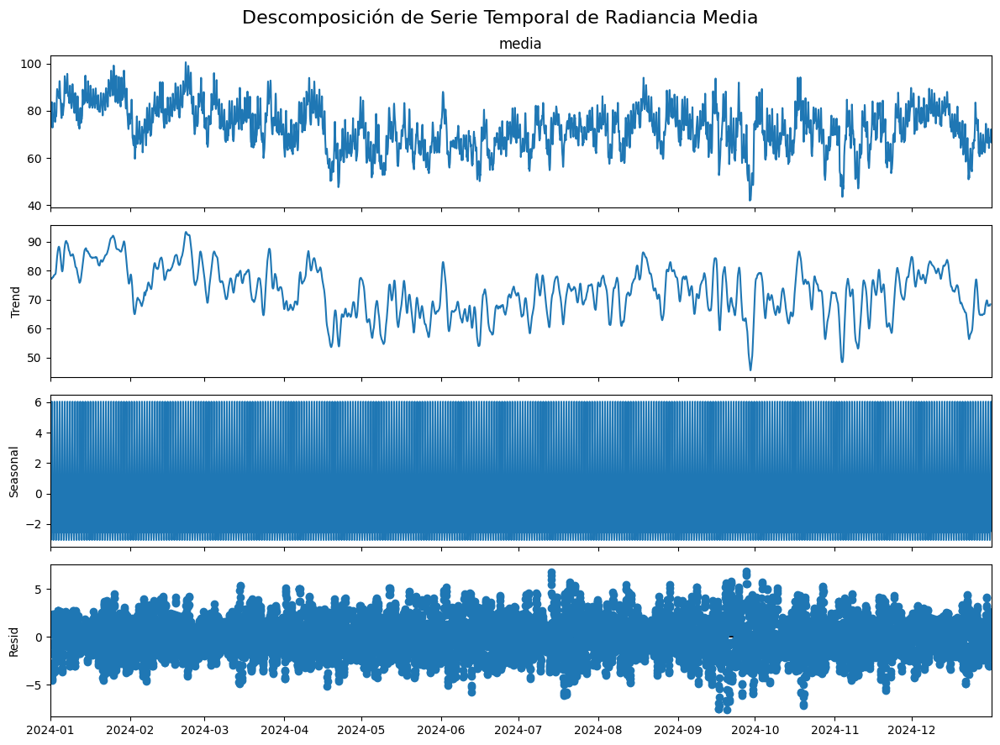

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Asegurar que la serie tenga frecuencia uniforme
# Resampleamos a una frecuencia horaria (puedes ajustar según tus datos)
serie_media = df_imagenes['media'].resample('h').mean()

# Rellenamos valores faltantes con interpolación (si hay huecos)
serie_media = serie_media.interpolate()

# Descomposición: modelo aditivo (puedes probar 'multiplicative' si tiene más sentido)
descomposicion = seasonal_decompose(serie_media, model='additive', period=24)  # 24 = diario si es por hora

# Graficar componentes
fig = descomposicion.plot()
fig.set_size_inches(12, 9)
fig.suptitle('Descomposición de Serie Temporal de Radiancia Media', fontsize=16)
plt.tight_layout()
plt.show()

* Promedio móvil simple

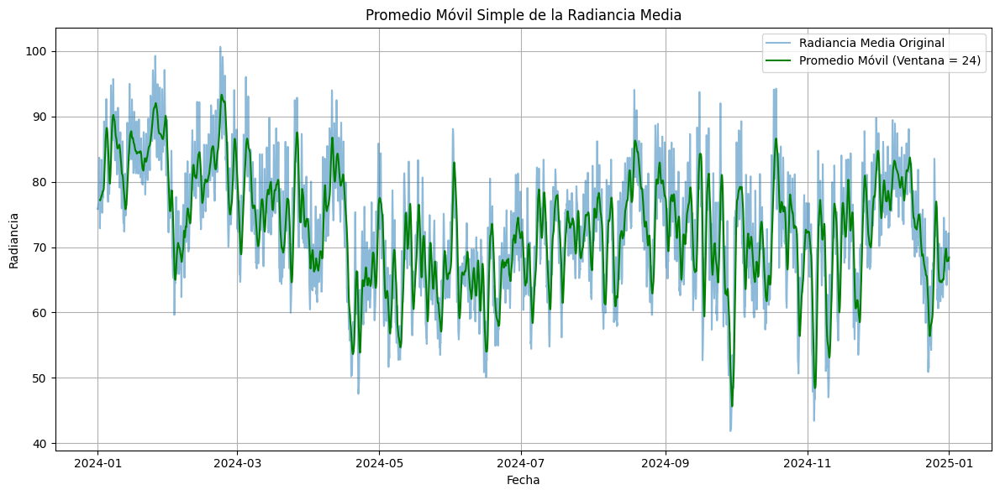

In [10]:
# 1. Resamplear la serie temporal a datos por hora
serie_media = df_imagenes['media'].resample('h').mean()

# 2. Rellenar valores faltantes si es necesario
serie_media = serie_media.interpolate()

# 3. Aplicar promedio móvil simple con una ventana de 24 (1 día si los datos son horarios)
ventana = 24
media_movil = serie_media.rolling(window=ventana).mean()

# 4. Graficar
plt.figure(figsize=(12, 6))
plt.plot(serie_media, label='Radiancia Media Original', alpha=0.5)
plt.plot(media_movil, label=f'Promedio Móvil (Ventana = {ventana})', color='green')
plt.title('Promedio Móvil Simple de la Radiancia Media')
plt.xlabel('Fecha')
plt.ylabel('Radiancia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

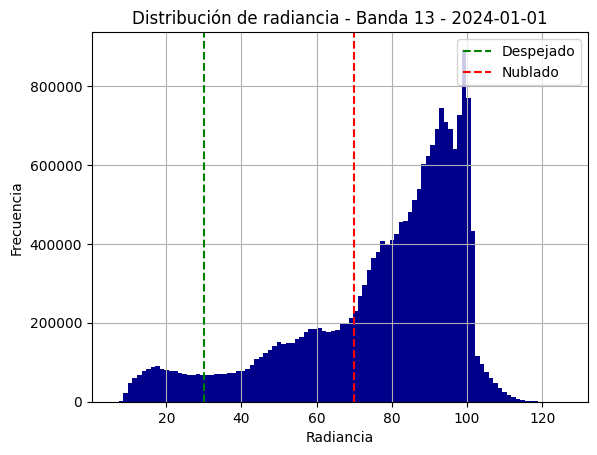

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# Rutas a todas las imágenes del día
archivos = sorted(Path("/home/fisica/bandas/banda13/imagenes_validas").glob("*20240101*_Rad13.npy"))

valores = []
for f in archivos:
    imagen = np.load(f)
    valores.append(imagen.flatten())

todos = np.concatenate(valores)

plt.hist(todos, bins=100, color="darkblue")
plt.title("Distribución de radiancia - Banda 13 - 2024-01-01")
plt.xlabel("Radiancia")
plt.ylabel("Frecuencia")
plt.axvline(30, color="green", linestyle="--", label="Despejado")
plt.axvline(70, color="red", linestyle="--", label="Nublado")
plt.legend()
plt.grid(True)
plt.show()


### Umbral de la radiancia

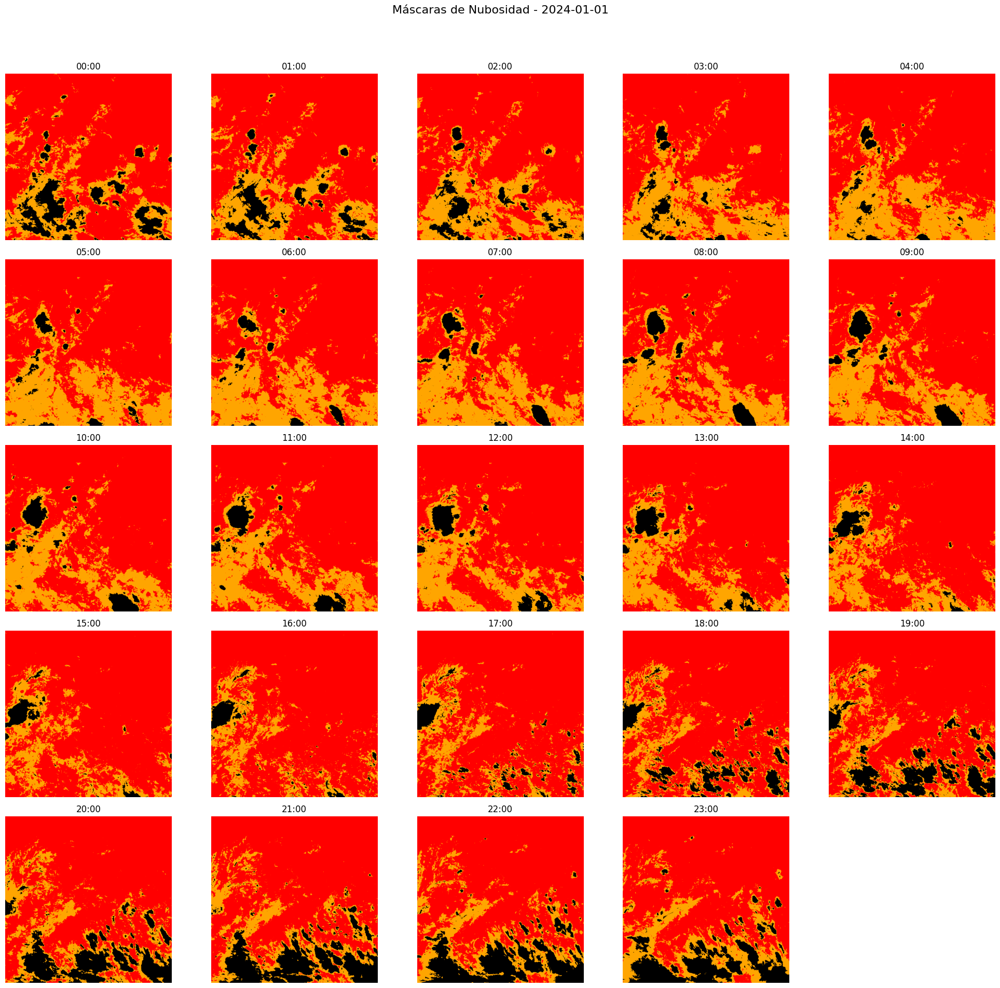

[array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 1, 1, 1],
       [2, 2, 2, ..., 0, 1, 1]], dtype=uint8), array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 1, 0, 0],
       [2, 2, 2, ..., 1, 0, 0],
       [2, 2, 2, ..., 0, 0, 0]], dtype=uint8), array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 1, 0, 0],
       [2, 2, 2, ..., 1, 0, 0],
       [2, 2, 2, ..., 0, 0, 0]], dtype=uint8), array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8), array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [1, 1, 1

In [38]:
# Importamos las librerías necesarias
import numpy as np                            # Para trabajar con arrays de NumPy (matrices de imágenes)
import matplotlib.pyplot as plt               # Para visualizar las imágenes en una cuadrícula (subplots)
from pathlib import Path                      # Para manejar rutas de carpetas y archivos de forma simple
import re                                     # Para trabajar con expresiones regulares (regex)
from datetime import datetime                 # Para convertir cadenas de fecha/hora en objetos datetime

# ---------- CONFIGURACIÓN ----------
directorio = Path("/home/fisica/bandas/banda13/imagenes_validas")  
fecha_deseada = "2024-01-01"                                        
canal = "Rad13"                                                    

# Umbrales de radiancia definidos según análisis previo
umbral_bajo = 30   # Menor a este valor: cielo despejado
umbral_alto = 70   # Mayor a este valor: alta nubosidad

# Expresión regular para extraer fecha y hora desde los nombres de los archivos
# Por ejemplo: "RadFC_20240101030020_Rad13.npy"
pat = re.compile(r"RadFC_(\d{8})(\d{6})_Rad13\.npy")

# ---------- CARGA Y FILTRADO DE ARCHIVOS ----------

# Listamos y seleccionamos solo los archivos .npy del canal y fecha deseada
archivos = sorted([
    f for f in directorio.glob(f"*{canal}.npy")
    if pat.match(f.name) and pat.match(f.name).group(1) == fecha_deseada.replace("-", "")
])

# ---------- CONFIGURACIÓN DE SUBPLOTS ----------

n = len(archivos)                          # Cantidad total de archivos encontrados para esa fecha
cols = 5                                   # Número de columnas en la cuadrícula
rows = (n + cols - 1) // cols              # Calculamos el número de filas necesarias (redondeo hacia arriba)

# Creamos la figura y los ejes (subplots)
fig, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))  # Tamaño escalado a cantidad de imágenes
axs = axs.flatten()                      # Aplanamos el array 2D de ejes para recorrerlo fácilmente

# ---------- PROCESAMIENTO Y VISUALIZACIÓN ----------
list_mask = []  # Lista para almacenar las máscaras generadas

for i, (f, ax) in enumerate(zip(archivos, axs)):
    # Cargamos la imagen de radiancia (matriz 920x920)
    imagen = np.load(f)
    
    # Creamos una máscara categórica:
    # 0 → despejado, 1 → nubosidad media, 2 → alta nubosidad
    mascara = np.zeros_like(imagen, dtype=np.uint8)
    mascara[(imagen > umbral_bajo) & (imagen <= umbral_alto)] = 1
    mascara[imagen > umbral_alto] = 2
    list_mask.append(mascara)  # Guardamos la máscara en la lista

    # Convertimos la máscara a una imagen RGB para visualizarla con colores:
    img_rgb = np.zeros((*mascara.shape, 3), dtype=np.uint8)
    img_rgb[mascara == 0] = [0, 0, 0]         # Negro → despejado
    img_rgb[mascara == 1] = [255, 165, 0]     # Naranja → nubosidad media
    img_rgb[mascara == 2] = [255, 0, 0]       # Rojo → alta nubosidad

    # Extraemos la hora del nombre del archivo para usarla como título del subplot
    fecha_str = pat.match(f.name).group(1) + pat.match(f.name).group(2)
    timestamp = datetime.strptime(fecha_str, "%Y%m%d%H%M%S")
    hora = timestamp.strftime("%H:%M")

    # Mostramos la imagen en el subplot
    ax.imshow(img_rgb)
    ax.set_title(f"{hora}")     # Hora como título
    ax.axis("off")              # Ocultamos ejes

    # ---------- LIMPIEZA DE SUBPLOTS VACÍOS ----------

# Si hay subplots sobrantes (por ejemplo, si el número de imágenes no llena la última fila), los eliminamos
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])   # Borra los subplots no usados

# ---------- FINALIZAR Y MOSTRAR FIGURA ----------

# Título general de la figura
plt.suptitle(f"Máscaras de Nubosidad - {fecha_deseada}", fontsize=16)

# Ajuste de espaciado para evitar solapamiento entre subplots y título
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Mostrar la figura en pantalla
plt.show()
print(list_mask)  # Imprimir la lista de máscaras generadas

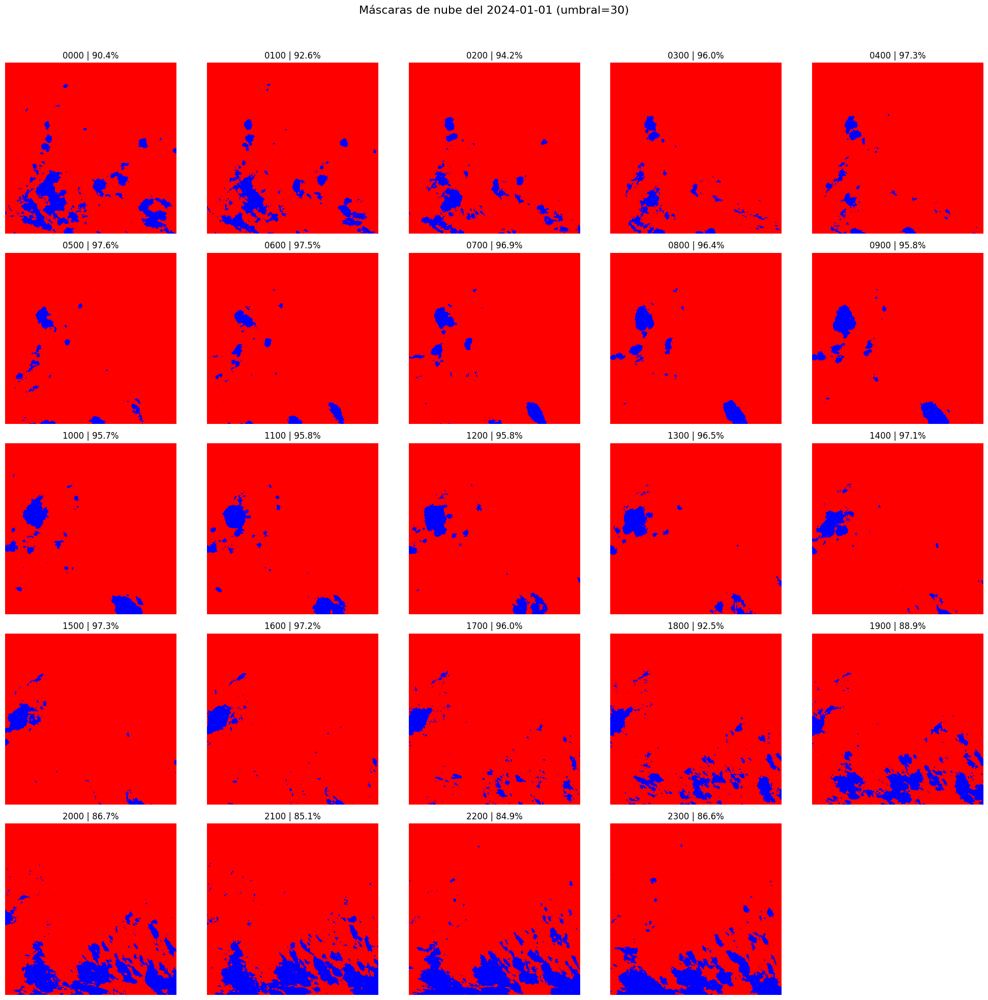

[array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 1, 1]], dtype=uint8), array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 0, 0],
       [1, 1, 1, ..., 1, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8), array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 0, 0],
       [1, 1, 1, ..., 1, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8), array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8), array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1

In [37]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import math

# Parámetros
ruta_archivos = "/home/fisica/bandas/banda13/imagenes_validas"
dia_especifico = "2024-01-01"
umbral_nube = 30  # Ajusta según análisis

# Filtrar archivos del día específico
archivos_dia = []
for archivo in os.listdir(ruta_archivos):
    if archivo.startswith("RadFC_") and archivo.endswith("_Rad13.npy"):
        fecha_archivo = archivo[6:14]  # YYYYMMDD
        if fecha_archivo == dia_especifico.replace("-", ""):
            archivos_dia.append(archivo)

if not archivos_dia:
    print(f"No se encontraron imágenes para el día {dia_especifico}")
else:
    archivos_dia.sort()
    total = len(archivos_dia)

    # Configurar visualización
    ncols = 5
    nrows = math.ceil(total / ncols)  # Redondea hacia arriba
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows))
    axes = axes.flatten()  # Aplanar para iterar fácilmente

    list_matrix = []
    list_mask = []

    for i, archivo in enumerate(archivos_dia):
        ruta_completa = os.path.join(ruta_archivos, archivo)
        matriz = np.load(ruta_completa)

        # Generar máscara binaria
        mascara_nube = (matriz > umbral_nube).astype(np.uint8)
        list_matrix.append(matriz)
        list_mask.append(mascara_nube)
        porcentaje_nube = np.mean(mascara_nube) * 100

        # Crear imagen RGB personalizada (azul: sin nube, rojo: con nube)
        cmap_nube = ListedColormap(['blue', 'red'])

        # Mostrar máscara directamente (más compacta que mostrar también la imagen original)
        ax = axes[i]
        ax.imshow(mascara_nube, cmap=cmap_nube)
        hora = archivo[14:18]
        ax.set_title(f"{hora} | {porcentaje_nube:.1f}%")
        ax.axis('off')

    # Eliminar subplots vacíos si sobran
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f'Máscaras de nube del {dia_especifico} (umbral={umbral_nube})', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    print(list_mask)


# Conclusiones

* El uso de archivos .npy y la construcción de un DataFrame con estadísticas clave (media, varianza, mínimo, máximo, mediana) permitió analizar grandes cantidades de imágenes satelitales de manera eficiente, evitando la sobrecarga de memoria.

* El análisis exploratorio mostró que la radiancia presenta variaciones significativas tanto a lo largo de los meses como de las horas del día, lo que evidencia la influencia de factores estacionales y horarios en la cobertura nubosa y la radiación solar.

* La detección de outliers mediante el rango intercuartílico y su reemplazo por la mediana mejoró la calidad de los datos, permitiendo obtener series temporales más limpias y representativas para el análisis y modelado.

* La descomposición aditiva y el uso del promedio móvil simple permitieron identificar tendencias, estacionalidades y fluctuaciones en la radiancia, facilitando la comprensión de los patrones temporales y la preparación de los datos para modelos predictivos.

* El escalado de las imágenes entre 0 y 1 y la organización de los datos en series temporales proporcionan una base sólida para la aplicación de modelos de aprendizaje automático orientados a la predicción del movimiento de nubes y la optimización de plantas fotovoltaicas.